In [1]:
from numpy.random import randint
import numpy as np # for importing numpy
import pandas as pd # for importing pandas
pd.set_option('display.expand_frame_repr', False)
pd.set_option('display.max_columns', None)
import matplotlib.pyplot as plt # for importing matplotlib
import seaborn as sns # seaborn is used to plot
from IPython.display import Image, display, HTML
# import warnings
import warnings
import matplotlib.gridspec as gridspec
import importlib # for reloading the scripts

In [2]:
# =============
# ==== FUNCTIONS =====
# =============
# # this has to return an array of pairs
# def get_col_names(concatenated_key_name, dic):
# 	# key_string is the name of the parent key
# 	# dic is the dictionary
# 	ans = []
# 	for x,y in dic.items():
# 		if concatenated_key_name == '':
# 			column_name = x
# 		else:
# 			column_name = concatenated_key_name + '_' + x
# 		# check if the value is a dictionary
# 		if type(y) == dict:
# 			tmp_arr = get_col_names(column_name,y)
# 			ans += tmp_arr
# 		else:
# 			ans.append(column_name)
# 	return ans
# 
# def get_col_vals(concatenated_key_name, dic):
# 	# key_string is the name of the parent key
# 	# dic is the dictionary
# 	ans = []
# 	for x,y in dic.items():
# 		if concatenated_key_name == '':
# 			column_name = x
# 		else:
# 			column_name = concatenated_key_name + '_' + x
# 		# check if the value is a dictionary
# 		if type(y) == dict:
# 			tmp_arr = get_col_vals(column_name,y)
# 			ans += tmp_arr
# 		else:
# 			ans.append(y)
# 	return ans
# 
# 
# 
# 
# def create_df_from_dic(dic):
# 	key = list(dic.keys())[0]
# 	# now we will get the column names from the dictionary
# 	ocol_names = get_col_names('',dic[key])
# 	ocol_names = ['id'] + ocol_names
# 	print(ocol_names)
# 	# we can see that it works, now we will construct the dataframe row by row
# 	df = pd.DataFrame(columns = ocol_names)
# 	for i,key in enumerate(dic.keys()):
# 		print(key)
# 		row = get_col_vals('',dic[key])
# 		row = [key] + row
# 		cols = get_col_names('',dic[key])
# 		cols = ['id'] + cols
# 		# add a new row to the dataframe and add all the values given by row and cols. if there is no such value, then it will be NaN
# 		# use the pd.concat function to add a new row to the dataframe
# 		df = pd.concat([df,pd.DataFrame([row],columns = cols)],ignore_index = True)
# 	return df
# 
# # %%
# 
# 
# # %%
# # read the pickle file
# pkl_file = open('../data/raw_data.pkl','rb')
# dic = pkl.load(pkl_file)
# pkl_file.close()
# 
# # %%
# df = create_df_from_dic(dic)
# 
# # %%
# # save the dataframe to a csv file
# df.to_csv('../data/raw_data.csv',index = False)

# Analysis of the data

In [3]:
with warnings.catch_warnings():
	warnings.simplefilter('ignore')

In [4]:
%%javascript
(function(on) {
const e = $("Setup failed");
const ns = "js_jupyter_suppress_warnings";
var cssrules = $("#" + ns);
if(!cssrules.length)
cssrules = $("").appendTo("head");
e.click(function() {
		var s = 'Showing';
		cssrules.empty()
		if(on) {
		s = 'Hiding';
		cssrules.append("div.output_stderr, div[data-mime-type*='.stderr'] { display:none; }");
		}
		e.text(s + ' warnings (click to toggle)');
		on = !on;
		}).click();
$(element).append(e);
})(true);

<IPython.core.display.Javascript object>

In [5]:
df = pd.read_csv('../data/raw_data.csv')

/tmp/ipykernel_1245234/2458245178.py:1: DtypeWarning: Columns (48,49) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('../data/raw_data.csv')


In [6]:
import simpleml as sml

In [7]:
# print all the unique values of the first 14 columns
for i in range(1,14):
	print(df.iloc[:,i].unique())
# so apparently the only country that we are analyzing is spain, hence we will drop all
# the columns that have the the pattern 'country*' in them

['EU']
['Spain']
['Madrid']
['Spain']
['ES']
['ESP']
[724]
['€']
['EUR']
['Euro']
[978]
['es-ES']
[34]


In [8]:
pattern = 'country'
# drop all the columns that have the pattern in their name
columns_to_drop = []
for col in df.columns:
	if col.startswith(pattern):
		columns_to_drop.append(col)

# also I have seen that the checkout_user_agent has 0 non-null values there fore I will drop it

columns_to_drop.append('checkout_user_agent')

In [9]:
print(columns_to_drop)

['country_continent', 'country_official_name', 'country_capital', 'country_name', 'country_alpha2', 'country_alpha3', 'country_numeric', 'country_currency_symbol', 'country_currency_code', 'country_currency_name', 'country_currency_numeric', 'country_locale', 'country_phone_prefix', 'checkout_user_agent']


In [10]:
df = df.drop(columns_to_drop,axis = 1)

In [11]:
df['target'].value_counts()

performing     24527
credit_risk     2001
fraud_risk       199
Name: target, dtype: int64

In [12]:
def rename_column(col_name):
	"""
	this function will rename a column from the format 'column_name' to 'columnName'
	also replaces all the instances of the 'checkout' word to 'chout'
	also replaces all the instances of the 'financing' word to 'fin'
	also replaces all the instances of the 'merchant' word to 'mer'
	"""
	# first we will split the string by the '_' character
	col_name = col_name.split('_')
	# now we will join the first word with the rest of the words
	col_name = col_name[0] + ''.join([x.capitalize() for x in col_name[1:]])
	# now we will replace the checkout word
	col_name = col_name.replace('checkout','Chout')
	# now we will replace the financing word
	col_name = col_name.replace('financing','Fin')
	# now we will replace the merchant word
	col_name = col_name.replace('merchant','Mer')
	return col_name

In [13]:
# rename all the columns
df.columns = [rename_column(x) for x in df.columns]

In [14]:
# are left with the following columns and categories
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26727 entries, 0 to 26726
Data columns (total 36 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            26727 non-null  object 
 1   totalAmount                   26727 non-null  float64
 2   created                       26727 non-null  object 
 3   MerActivityCode               26727 non-null  int64  
 4   MerActivityName               26727 non-null  object 
 5   MerId                         26727 non-null  object 
 6   ChoutOrigin                   26727 non-null  object 
 7   ChoutUserAgentDeviceModel     14201 non-null  object 
 8   ChoutUserAgentOsFamily        25410 non-null  object 
 9   ChoutUserAgentIsMobile        25410 non-null  object 
 10  ChoutUserAgentIsTablet        25410 non-null  object 
 11  ChoutUserAgentDeviceBrand     14201 non-null  object 
 12  ChoutUserAgentIsPc            25410 non-null  object 
 13  C

None

we have some main categories
- total_ammount
- created
- checkout
- financing
- target

we will analyze all the numerical variables first using a pair plot, and then we will analyze all 
the categorical variables using pie plots

In [15]:
# get the numerical columns
num_cols = df.select_dtypes(include = ['int64','float64']).columns
num_df = df[num_cols]
num_df['target'] = df['target']

# we will drop the merchant_activity_code since it is just a code and 
# I can use merchant_activity_name instead
num_df.drop(columns = ['MerActivityCode'],inplace = True)
# we will drop the financing_plan_total_tax_amount since it is 0 in spain
num_df.drop(columns = ['FinPlanTotalTaxAmount'],inplace = True)



/tmp/ipykernel_1245234/1625519764.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_df['target'] = df['target']
/tmp/ipykernel_1245234/1625519764.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_df.drop(columns = ['MerActivityCode'],inplace = True)
/tmp/ipykernel_1245234/1625519764.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_df.drop(columns = ['FinPlanTo

In [16]:
# take a 30% sample of the data
# sample_df = num_df.sample(frac = 0.3, random_state = 42)
sample_df = num_df

In [17]:
sample_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26727 entries, 0 to 26726
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   totalAmount                  26727 non-null  float64
 1   FinPlanPrincipal             26727 non-null  float64
 2   FinPlanDuration              26727 non-null  int64  
 3   FinPlanDownpaymentAmount     26727 non-null  float64
 4   FinPlanTotalInterestAmount   26727 non-null  float64
 5   FinPlanAnnualPercentageRate  26727 non-null  float64
 6   FinPlanCustomerFeeTaxRate    26727 non-null  float64
 7   FinPlanDailyInterestPerCent  26727 non-null  float64
 8   FinPlanInstalmentAmount      26727 non-null  float64
 9   FinPlanNumInstalments        26727 non-null  int64  
 10  target                       26727 non-null  object 
dtypes: float64(8), int64(2), object(1)
memory usage: 2.2+ MB


In [18]:
# create a pairplot
# get the first 6 columns
# cols = sample_df.columns[1]
# print(cols)
# tmp_df = sample_df[cols]
# tmp_df['target'] = sample_df['target']
# sml.plot.pair_grid(sample_df, hue = 'target', regplot = True)

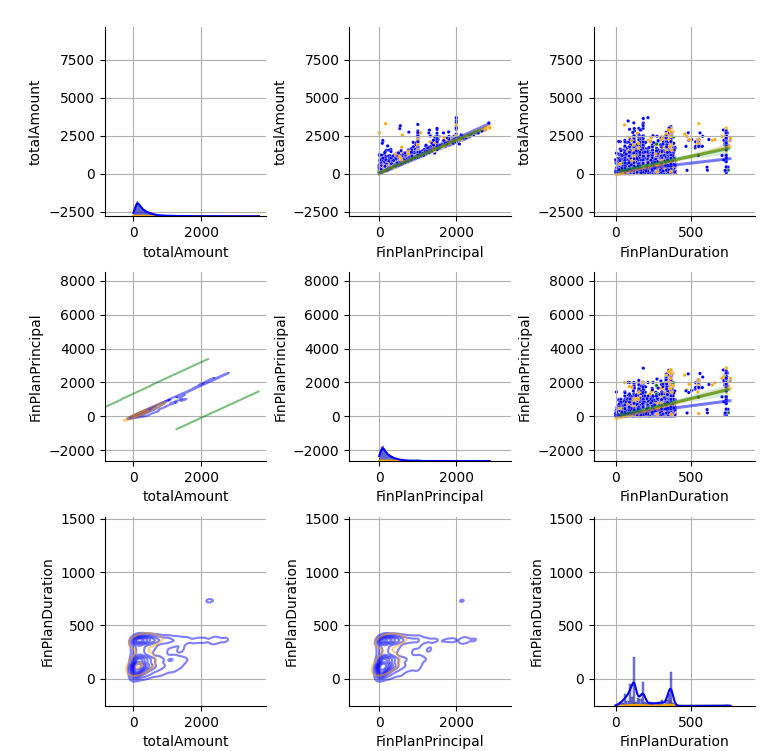

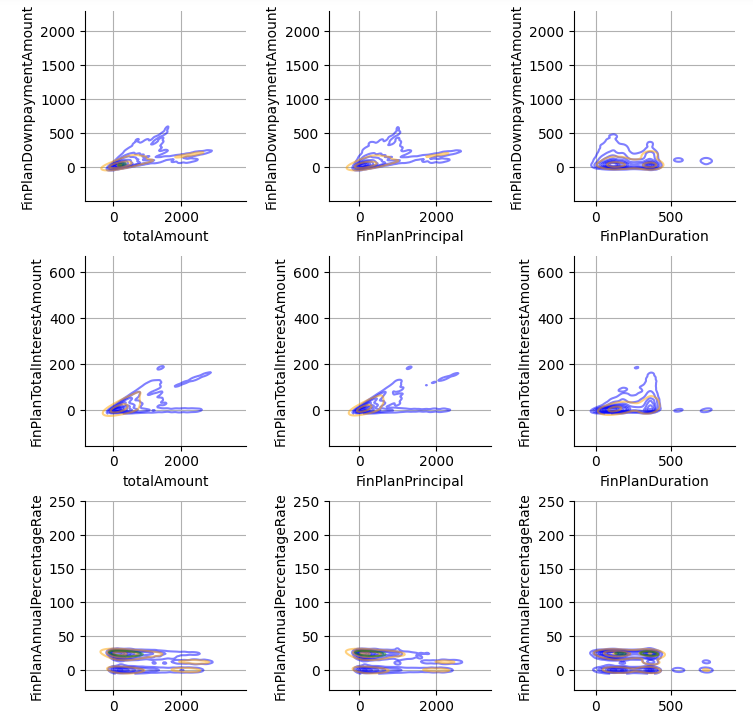

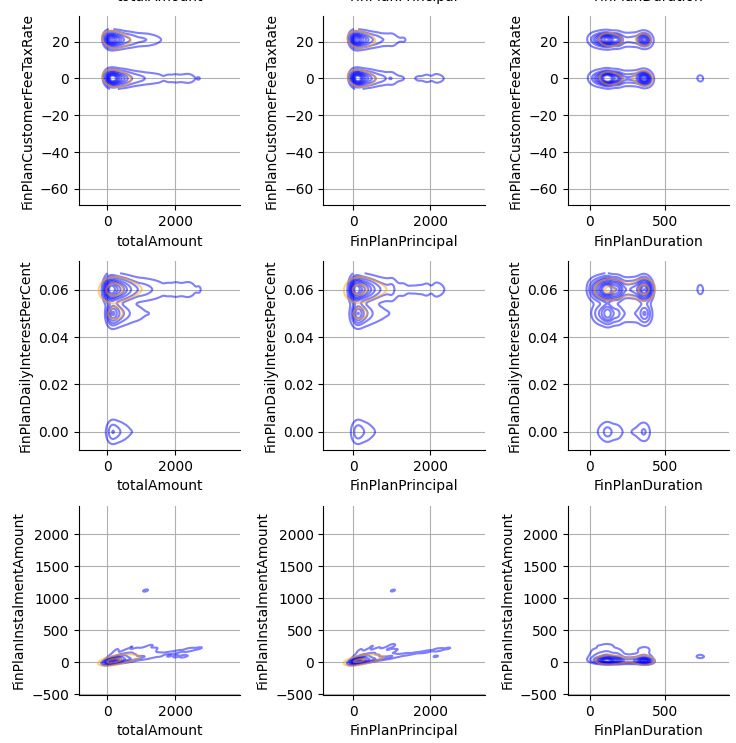

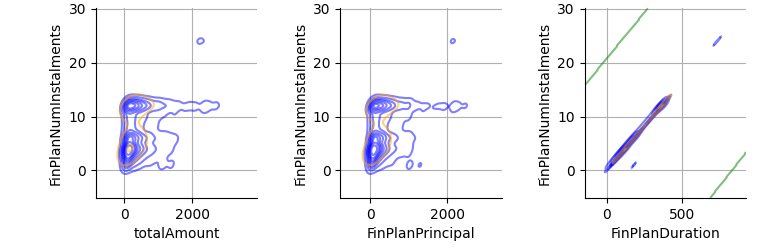

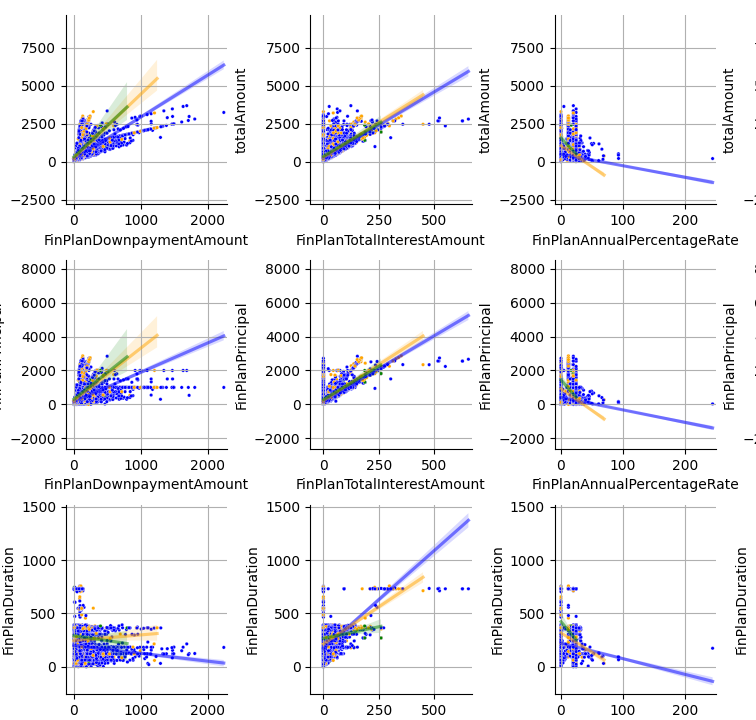

...

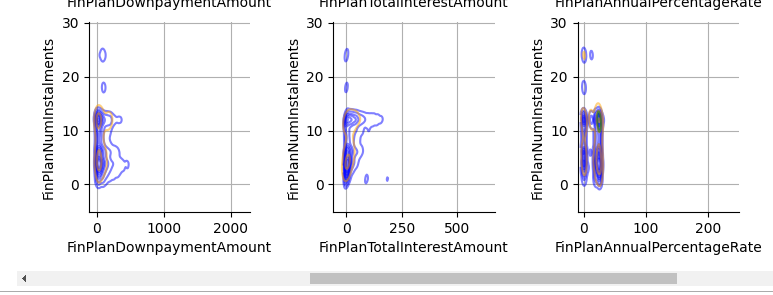

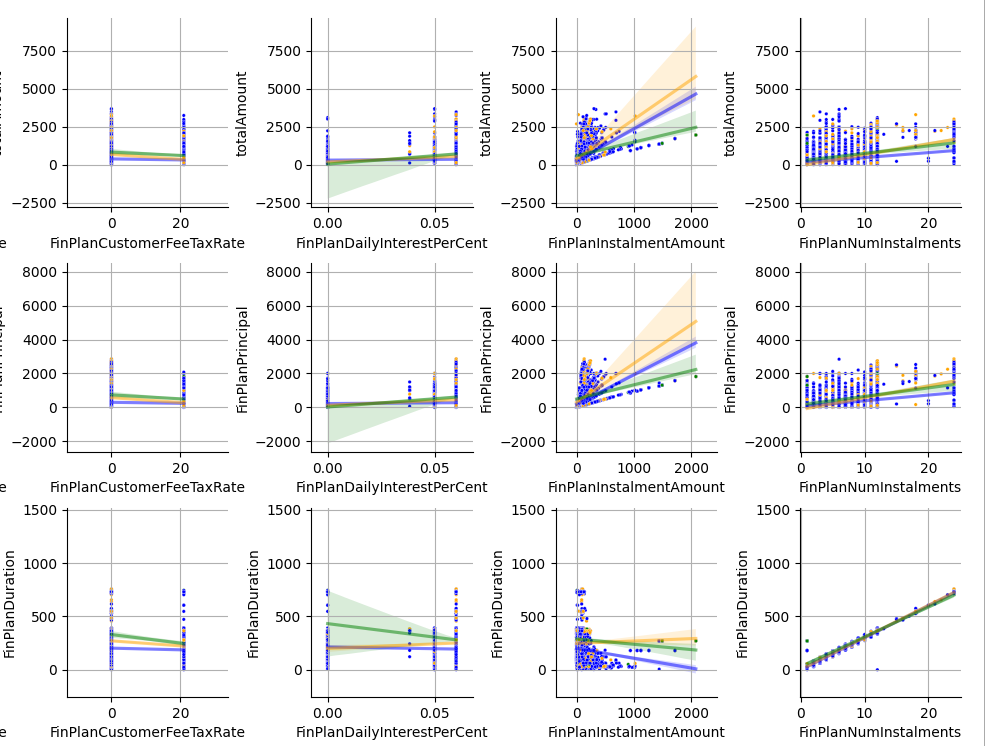

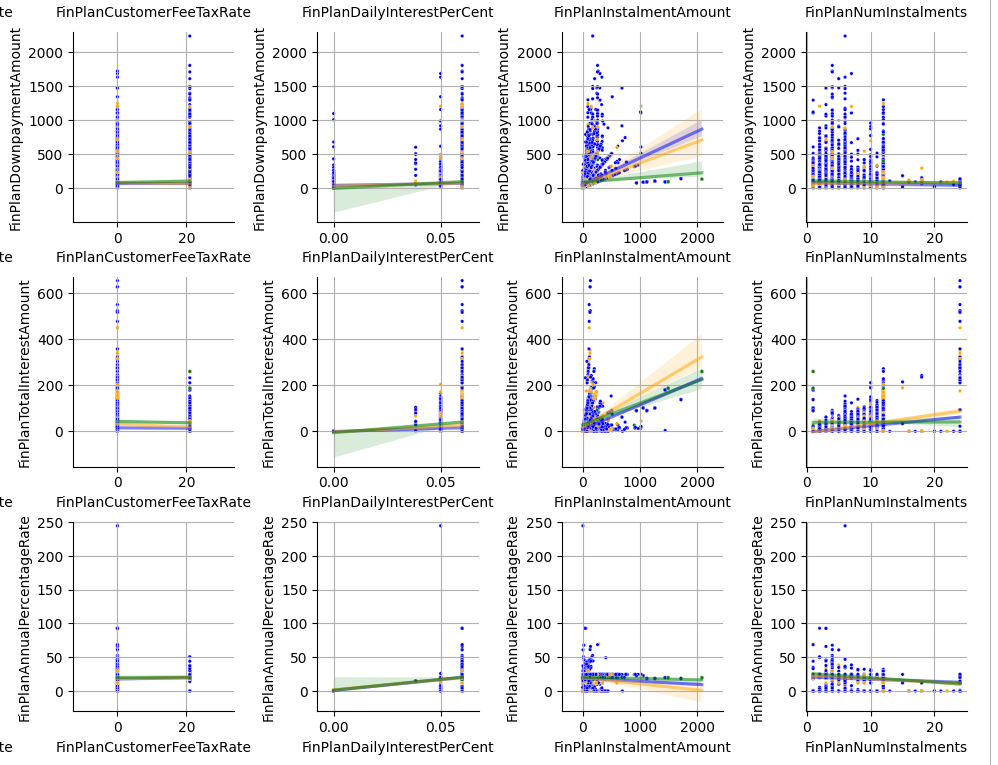

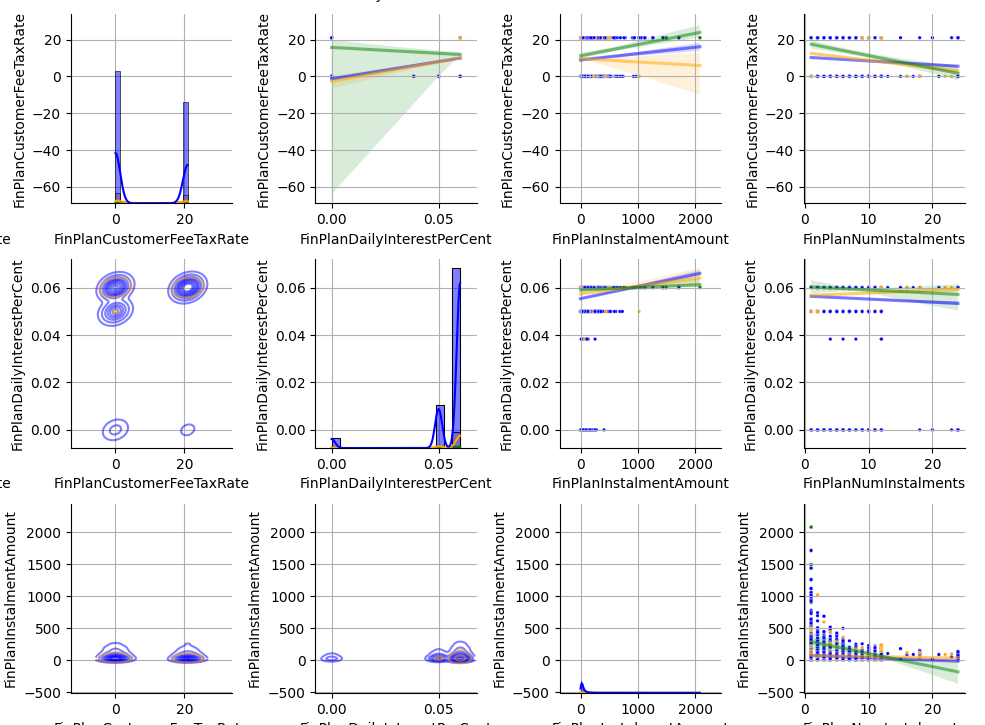

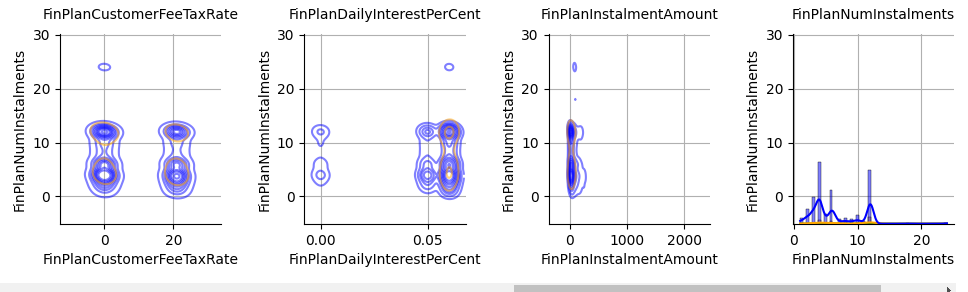

In [19]:
display(Image('images/pp1.png'))
display(Image('images/pp2.png'))
display(Image('images/pp3.png'))
display(Image('images/pp4.png'))
display(Image('images/pp5.png'))
display(Image('images/pp6.png'))
display(Image('images/pp7.png'))
display(Image('images/pp8.png'))
display(Image('images/pp9.png'))
display(Image('images/pp10.png'))
display(Image('images/pp11.png'))
display(Image('images/pp12.png'))

analyzing the numerical variables we can see the features that could be usefull for

In [20]:
display(sample_df.head())
display(sample_df.info())
display(sample_df.describe())



,totalAmount,FinPlanPrincipal,FinPlanDuration,FinPlanDownpaymentAmount,FinPlanTotalInterestAmount,FinPlanAnnualPercentageRate,FinPlanCustomerFeeTaxRate,FinPlanDailyInterestPerCent,FinPlanInstalmentAmount,FinPlanNumInstalments,target
0,148.27,118.616000,121,29.65,0.000000,0.0,21.0,0.060055,29.654000,4,performing
1,26.77,19.891289,90,6.88,0.744844,24.5,21.0,0.060055,6.878711,3,performing
2,155.99,133.705714,182,22.28,0.000000,0.0,21.0,0.060055,22.284286,6,performing
3,189.00,170.100000,274,18.90,0.000000,0.0,0.0,0.060055,18.900000,9,performing
4,482.79,442.236802,361,40.55,44.401573,20.0,0.0,0.049964,40.553198,12,performing


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26727 entries, 0 to 26726
Data columns (total 11 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   totalAmount                  26727 non-null  float64
 1   FinPlanPrincipal             26727 non-null  float64
 2   FinPlanDuration              26727 non-null  int64  
 3   FinPlanDownpaymentAmount     26727 non-null  float64
 4   FinPlanTotalInterestAmount   26727 non-null  float64
 5   FinPlanAnnualPercentageRate  26727 non-null  float64
 6   FinPlanCustomerFeeTaxRate    26727 non-null  float64
 7   FinPlanDailyInterestPerCent  26727 non-null  float64
 8   FinPlanInstalmentAmount      26727 non-null  float64
 9   FinPlanNumInstalments        26727 non-null  int64  
 10  target                       26727 non-null  object 
dtypes: float64(8), int64(2), object(1)
memory usage: 2.2+ MB


None

,totalAmount,FinPlanPrincipal,FinPlanDuration,FinPlanDownpaymentAmount,FinPlanTotalInterestAmount,FinPlanAnnualPercentageRate,FinPlanCustomerFeeTaxRate,FinPlanDailyInterestPerCent,FinPlanInstalmentAmount,FinPlanNumInstalments
count,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000
mean,363.783704,288.146210,199.837505,66.991562,15.200610,18.603670,9.151308,0.055810,53.951505,6.667976
std,426.207521,366.558646,118.875399,95.940822,28.616398,9.849386,10.413217,0.012128,100.557838,3.914561
min,0.800000,0.005740,0.000000,0.190000,0.000000,-0.000255,0.000000,0.000000,0.001170,1.000000
25%,122.310000,86.752256,119.000000,23.295000,1.066514,20.000000,0.000000,0.060055,17.958051,4.000000
50%,222.040000,168.458784,162.000000,40.000000,5.199420,24.500000,0.000000,0.060055,32.218629,6.000000
75%,427.785000,337.392259,336.000000,75.635000,16.797996,24.500000,21.000000,0.060055,59.103906,11.000000
max,3686.340000,2865.927731,758.000000,2239.090000,655.136030,244.826455,21.000000,0.060055,2079.999963,24.000000


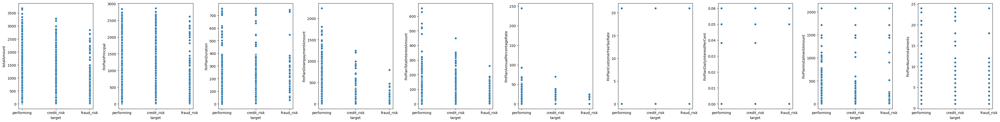

In [21]:
# do a scatter plot for each column using 'target' as x
# use seaborn
fig, ax = plt.subplots(1, len(sample_df.columns) - 1, figsize = (40, 5))
for i, col in enumerate(sample_df.columns):
	if col != 'target':
		sns.scatterplot(x = 'target', y = col, data = sample_df, ax = ax[i])
		ax[i].set_xlabel('target')
		ax[i].set_ylabel(col)
plt.tight_layout()
plt.show()

we don't see anything clear here because points overlap with each other and since there are more 'performing' values ( exponentially )
we cannot assess the data properly

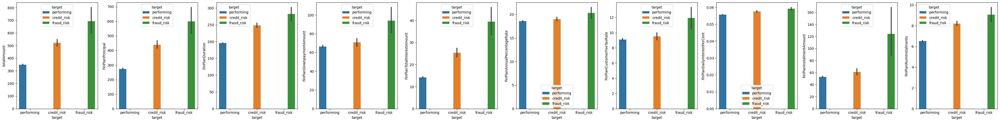

In [22]:
# do a bar plot with x as the target and y as the column
fig, ax = plt.subplots(1,len(sample_df.columns) - 1, figsize = (40,5))
for i, col in enumerate(sample_df.columns):
	if col == 'target':
		continue
	sns.barplot(x = 'target',y = col, data = sample_df, ax = ax[i], hue = 'target')
	ax[i].set_xlabel('target')
	ax[i].set_ylabel(col)
plt.tight_layout()
plt.show()

so after analyzing the numerical variables using a bar plot ( and given error bars ) we can see that there is a lot of variance when there is a fraud risk ( it makes sense because they are imputting values naturally out from the norm )
given this disparity we could use a random forest classifier to predict the target variable
apparently



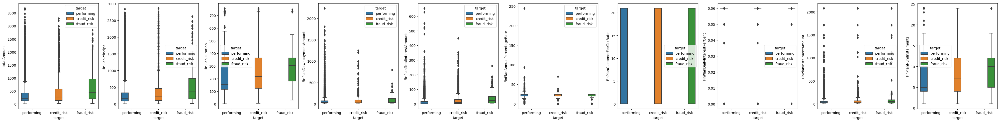

In [23]:
# do a box plot with x as the target and y as the column
fig, ax = plt.subplots(1,len(sample_df.columns) - 1, figsize = (40,5))
for i, col in enumerate(sample_df.columns):
	if col == 'target':
		continue
	sns.boxplot(x = 'target',y = col, data = sample_df, ax = ax[i], hue = 'target')
	ax[i].set_xlabel('target')
	ax[i].set_ylabel(col)
plt.tight_layout()
plt.show()

apparently after doing a box plot is not going to be so easy to predict the target vairable since there are
a lot of outliars for the 'performing' values, but we will have to test this in the feature selection part

In [24]:
# we will do a joint plot for each column
# fig, ax = plt.subplots(3,27, figsize = (100,15))
# flat = ax.flat
# counter = 0
# for col in sample_df.columns:
# 	for col2 in sample_df.columns:
# 		if col == 'target' or col2 == 'target':
# 			continue
# 		sns.jointplot(x = col, y = col2, data = sample_df, ax = flat[counter], hue = 'target')
# 		flat[counter].set_xlabel(col)
# 		flat[counter].set_ylabel(col2)
# 		counter += 1
# plt.tight_layout()
# plt.show()

In [25]:
import os

In [26]:
import matplotlib.image as mpimg

In [27]:
def multijoint(data = None, hue = None, xy_col_names = None, nrows = -1, ncols = -1):
	"""
	for plotting multiple joint plots at once
	data = dataframe --> the pandas dataframe
	hue = 'col_target_name' --> the name of the target column
	nrows = 2 -> number of rows
	ncols = 2 -> number of cols
	xy_col_names = [['col1','col2'],['col3','col4'],...] --> list of lists of column names
	"""
	# get the full path in the current directory
	cur_path = os.path.abspath(os.getcwd())
	img_tmp_folder = cur_path + '/.tmp/images/multijoint'



	foldername = img_tmp_folder + '/jointplot'
	# while the foldername exists change the name until you find a name that doesn't exist
	while os.path.exists(foldername):
		foldername += '_'
	# create the folder
	os.makedirs(foldername)
	# delete all the data inside the img_tmp_folder, but before ask for confirmation
	
	# check if data, xy_col_names are None
	if data is None:
		raise ValueError('data cannot be None')
	if xy_col_names is None:
		raise ValueError('xy_col_names cannot be none')
	# check if xy_col_names is a list
	if not isinstance(xy_col_names, list):
		raise ValueError('xy_col_names must be a list')
	# check if xy_col_names is a list of lists
	if not all([isinstance(x, list) for x in xy_col_names]):
		raise ValueError('xy_col_names must be a list of lists')
	# check if all the lists in xy_col_names have 2 elements
	if not all([len(x) == 2 for x in xy_col_names]):
		raise ValueError('xy_col_names must be a list of lists with 2 elements each')
	# check if nrows and ncols are -1
	if nrows == -1:
		nrows = 1
	# check if ncols is -1
	if ncols == -1:
		ncols = len(xy_col_names) // nrows
	# check if nrows * ncols is not equal to len(xy_col_names)
	if nrows * ncols != len(xy_col_names):
		raise ValueError('nrows * ncols must be equal to len(xy_col_names)')
	# create the figure
	fig, ax = plt.subplots(nrows, ncols, figsize = (3 * ncols, 3 * nrows))
	for i,pair_val in enumerate(xy_col_names):
		g = sns.jointplot(x = xy_col_names[i][0], y = xy_col_names[i][1], data = data, hue = hue, kind = 'kde')
		g.savefig(img_tmp_folder + '/jointplot' + str(i) + '.png')
		plt.close(g.fig)
	# flatten the ax
	flat = ax.flat
	# iterate over the images and plot them
	for i in range(len(xy_col_names)):
		img = mpimg.imread(img_tmp_folder + '/jointplot' + str(i) + '.png')
		flat[i].imshow(img)
	# turn off x and y axis
	[axs.set_axis_off() for axs in ax.ravel()]
	# show the plot
	plt.tight_layout()
	plt.show()

In [28]:
xy_col_names = []
for col in sample_df.columns:
	for col2 in sample_df.columns:
		if col == 'target' or col2 == 'target' or col == col2:
			continue
		xy_col_names.append([col,col2])

In [29]:
print(len(xy_col_names))

90


/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/ano

/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/venv/lib/python3.10/site-packages/seaborn/distributions.py:1185: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/ano

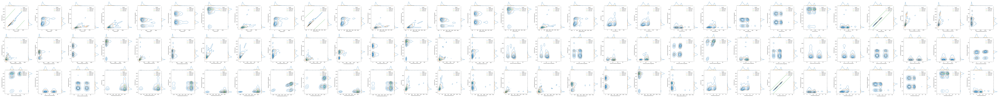

In [30]:
# get 20% of the sample_df
tmp = sample_df.sample(frac = 0.2, random_state = 42)
hue = 'target'
multijoint(data = tmp, hue = hue, xy_col_names = xy_col_names,ncols = 30, nrows = 3)

In [31]:
# data cleaned for fraud_risk
fraud_risk = sample_df[sample_df['target'] == 'fraud_risk']

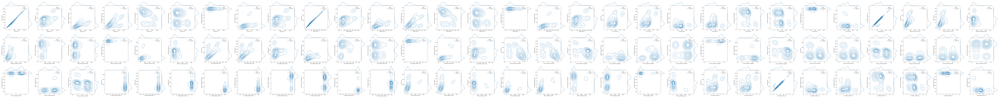

In [32]:
multijoint(data = fraud_risk, hue = hue, xy_col_names = xy_col_names,ncols = 30, nrows = 3)

In [39]:
# now get all the categorical data to see the relationships in the data
cat_cols = df.select_dtypes(include = ['object']).columns
cat_df = df[cat_cols]
cat_df['target'] = df['target']

/tmp/ipykernel_1245234/827822405.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_df['target'] = df['target']


In [42]:
cat_cols

Index(['id', 'created', 'MerActivityName', 'MerId', 'ChoutOrigin',
       'ChoutUserAgentDeviceModel', 'ChoutUserAgentOsFamily',
       'ChoutUserAgentIsMobile', 'ChoutUserAgentIsTablet',
       'ChoutUserAgentDeviceBrand', 'ChoutUserAgentIsPc',
       'ChoutUserAgentOsVersion', 'ChoutUserAgentDeviceFamily',
       'ChoutUserAgentBrowserFamily', 'ChoutUserAgentBrowserVersion',
       'ChoutUserAgentValue', 'ChoutUserAgentIsTouchCapable',
       'ChoutCustomerBirthday', 'ChoutCustomerAddressRegion',
       'ChoutCustomerDocumentIdType', 'FinPlanFirstPaymentDate', 'target',
       'MerActivityNameEs', 'MerActivityNameEn'],
      dtype='object')

In [43]:
cat_df.head()

,id,created,MerActivityName,MerId,ChoutOrigin,ChoutUserAgentDeviceModel,ChoutUserAgentOsFamily,ChoutUserAgentIsMobile,ChoutUserAgentIsTablet,ChoutUserAgentDeviceBrand,ChoutUserAgentIsPc,ChoutUserAgentOsVersion,ChoutUserAgentDeviceFamily,ChoutUserAgentBrowserFamily,ChoutUserAgentBrowserVersion,ChoutUserAgentValue,ChoutUserAgentIsTouchCapable,ChoutCustomerBirthday,ChoutCustomerAddressRegion,ChoutCustomerDocumentIdType,FinPlanFirstPaymentDate,target,MerActivityNameEs,MerActivityNameEn
0,9a2d10fd9e8941de98cc7de1441fdcda,2018-12-08T09:35:07.751401Z,Informatica y Electrónica,776b630e228e499c83b66f8f0ddaab18,online,NaN,windows,False,False,NaN,True,10,other,Chrome,70.0.3538,Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebK...,False,1954-02-03,Catalunya,nif,2019-01-08,performing,NaN,NaN
1,d4183f2f7bde479fa22b00fc13f478d0,2018-12-08T09:58:42.707651Z,Mascotas,94095397bf6e449e8332ac678040ab70,online,Smartphone,android,True,False,Generic,False,8.0.0,generic smartphone,Chrome Mobile,70.0.3538,Mozilla/5.0 (Linux; Android 8.0.0; RNE-L21) Ap...,True,1991-11-10,Castilla y León,nif,2019-01-08,performing,NaN,NaN
2,339c4435b0e0461eb7d8149d702bf88a,2018-12-08T09:38:55.413728Z,Informatica y Electrónica,776b630e228e499c83b66f8f0ddaab18,online,iPhone,ios,True,False,Apple,False,12.1,iphone,Mobile Safari,12.0,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,True,1992-05-07,Extremadura,nif,2019-01-08,performing,NaN,NaN
3,68a840a4725144118aca09513a5db11b,2018-12-08T11:56:24.190451Z,Moda y Complementos,e2f9246b7b9e432fb07372c1b1d36dcc,online,iPhone,ios,True,False,Apple,False,10.3.2,iphone,Mobile Safari,10,Mozilla/5.0 (iPhone; CPU iPhone OS 10_3_2 like...,True,1980-01-30,Aragón,nif,2019-01-08,performing,NaN,NaN
4,5ed94ecd629e4d65a76e6d32aedf8fa5,2018-12-08T09:09:19.901214Z,Hogar y Decoración,513f1c5b8be0415497902ee716840403,online,iPhone,ios,True,False,Apple,False,12.1,iphone,Mobile Safari,12.0,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,True,1959-01-30,Galicia,nif,2019-01-04,performing,NaN,NaN


In [47]:
dcat_df = cat_df.drop(columns = ['id','created','MerId','created','ChoutUserAgentValue'])

In [52]:
cat_cols = dcat_df.columns

# =============
# ==== we will visualize the categorical data =====
# =============
the COlumns with categorical data are:
- MerActivityName
- ChoutOrigin
- ChoutUserAgentDeviceModel
- ChoutUserAgentOsFamily
- ChoutUserAgentIsMobile
- ChoutUserAgentIsTablet
- ChoutUserAgentDeviceBrand
- ChoutUserAgentIsPc
- ChoutUserAgentBrowserFamily
- ChoutUserAgentIsTouchCapable
- ChoutCustomerAddressRegion
- ChoutCustomerDocumentIdType

In [55]:
for i in range(len(cat_cols)):
	print(cat_cols[i])
	print(dcat_df.iloc[:,i].unique())

MerActivityName
['Informatica y Electrónica' 'Mascotas' 'Moda y Complementos'
 'Hogar y Decoración' 'Salud y Belleza' 'Juguetes'
 'Motor, Recambios y Accesorios Motor' 'Electrodomésticos' 'Deportes'
 'Otros' 'Educación y Formación' 'Viajes y Turismo'
 'Instrumentos Musicales' 'Bebés' 'Joyería' 'Marketplaces'
 'Federaciones Deportivas' 'Servicios y Productos Médicos' 'Libros'
 'Servicios Profesionales y Federaciones'
 'Entradas Conciertos y Espectáculos' 'Home and Decor'
 'Education and Training' 'Health and Beauty' 'Sports'
 'Fashion and Accessories' 'Travels and tourism'
 'Computing and Electronic' 'Jewelry' 'Babies'
 'Motor, Spare parts and Engine accessories' 'Others' 'Home appliances'
 'Toys' 'Pets' 'Books' 'Concert and Show Tickets' 'Musical instruments'
 'Sports Federations' 'Medical Products and Services'
 'Professional Services and Federations']
ChoutOrigin
['online' 'offline']
ChoutUserAgentDeviceModel
[nan 'Smartphone' 'iPhone' 'SM-J510FN' 'iPad' 'K420' 'RIO-L01' 'SM-A520F'
 

Text(0.5, 1.0, 'Target Column (samples: 26727)')

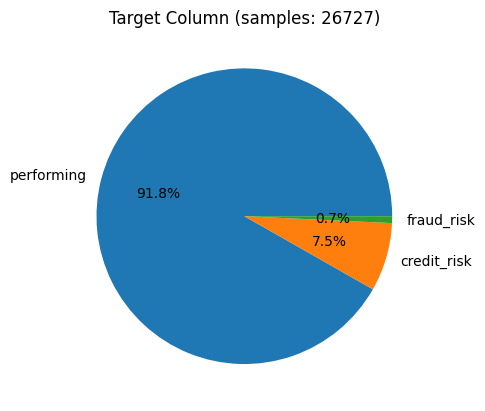

In [77]:
# first we will create a pie plot for the target column
# get the counts of the target column
target_counts = dcat_df['target'].value_counts()
plt.pie(target_counts, labels = target_counts.index, autopct = '%1.1f%%')
plt.title('Target Column (samples: ' + str(sum(target_counts)) + ')')

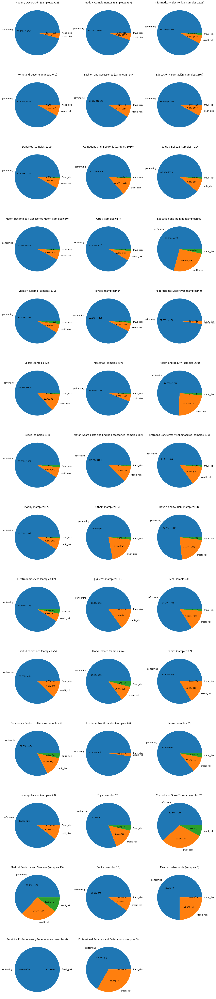

In [71]:
# we will analyse the MerActivityCode column in detail
smlp.pie_plot(data = dcat_df, target = 'target',pivot = 'MerActivityName')

it seems to be that MerActivityName also influences a lot but there are categories that don't
have  a lot of information ( hence they can be very biased ) so maybe we will need to do some feature
engineering to compensate for those columns that have a lot of bias

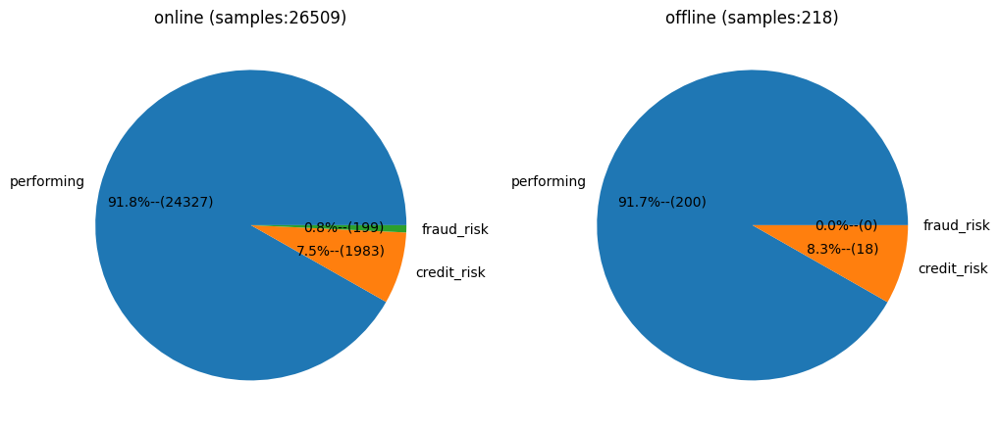

In [72]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutOrigin')

of course there seems to be a relationship between online checkouts and fraud risk, hence we will need to 
add this as a feature to our model




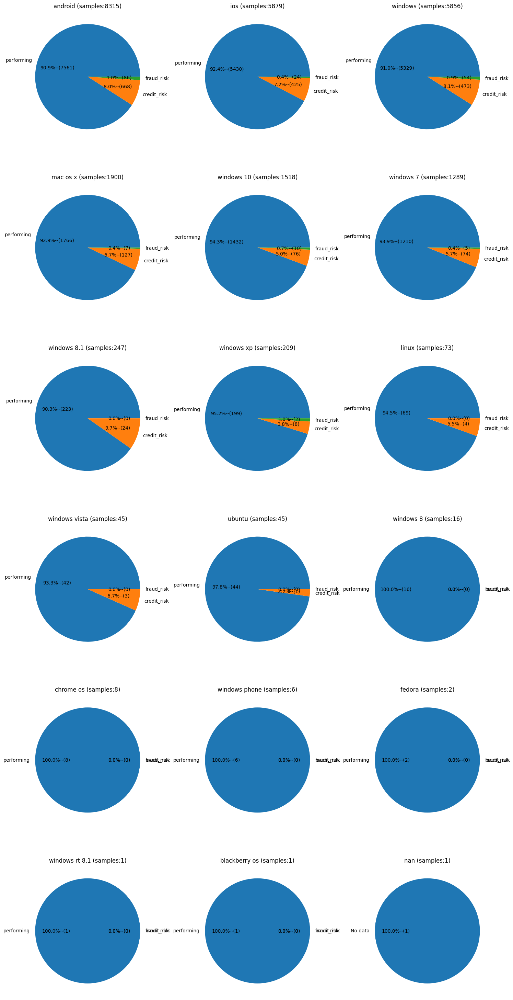

In [76]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutUserAgentOsFamily')

also this seems like a good category hence we will, we can see that fraud risk generally doesn't comes from ios
and, and it doesn't seems to be a difference between android and windows. but actually ironically from linux there are not fraud risks and also
from windows 8.1
also from very uncommon devices there is usually no fraud risk

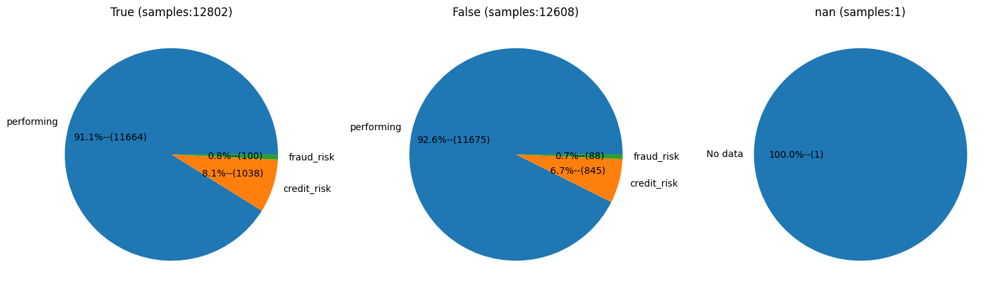

In [78]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutUserAgentIsMobile')

apparently there is no difference wether it is mobile or not

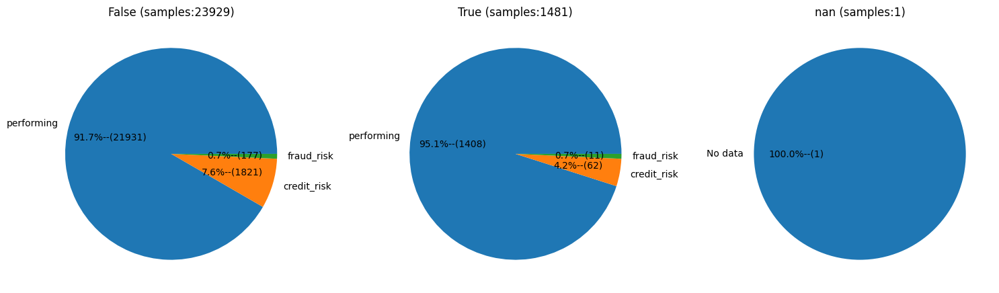

In [79]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutUserAgentIsTablet')

In [ ]:
# also apparently there is no difference if it is tablet or not since fraud_risk globally is 0.7
# but for credit_risk there is a difference

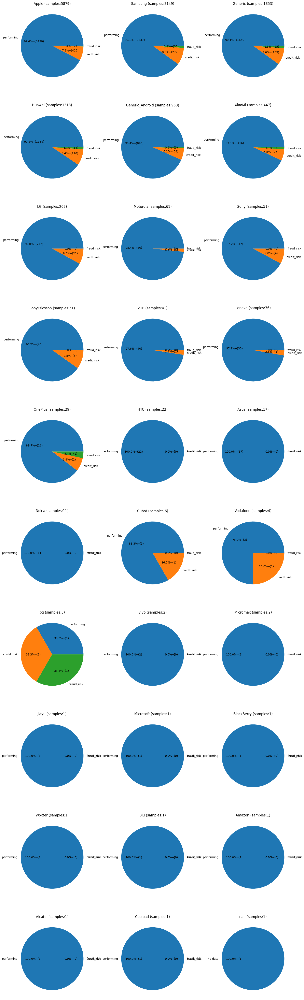

In [80]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutUserAgentDeviceBrand')

with the device brand there seems to be a tangible difference in all the plots, for example we see again that apple devices 
play a huge role for fraud risk but not for credit_risk

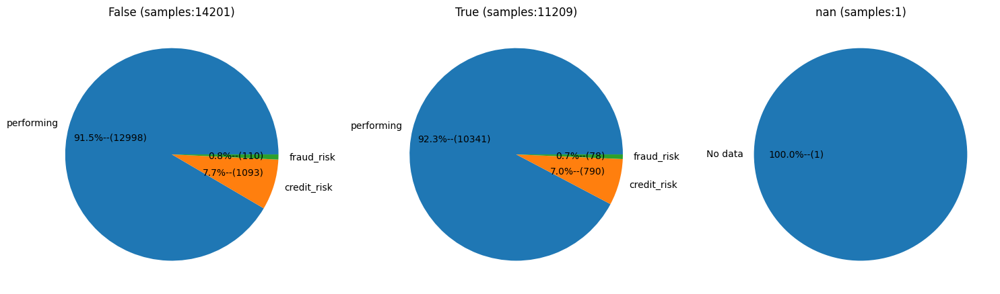

In [81]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutUserAgentIsPc')

also there seems to be no difference at all wether it is pc or not

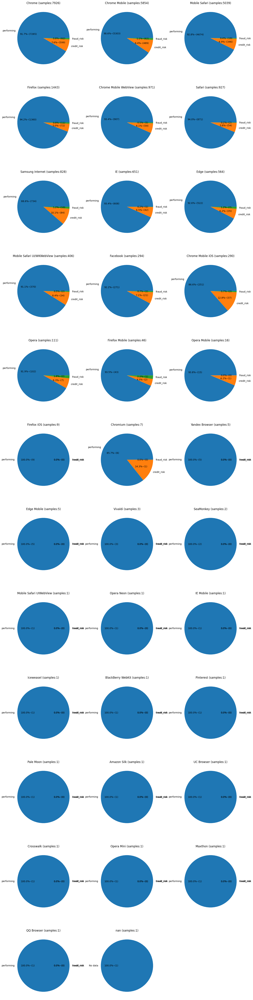

In [82]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutUserAgentBrowserFamily')

also there seems to be a high correlation for the browser family and the necessary feature values

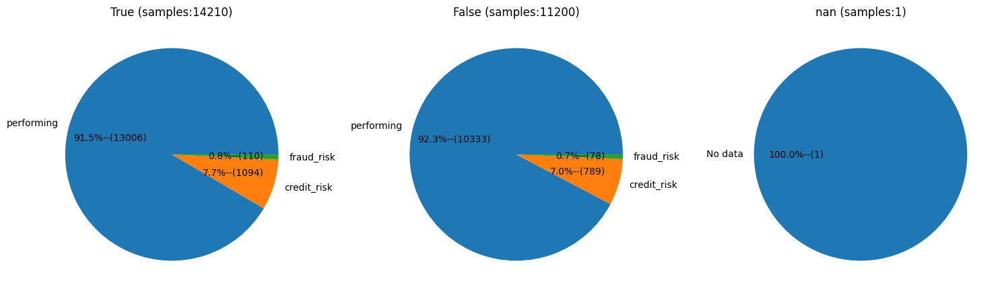

In [83]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutUserAgentIsTouchCapable')

apparently there is no relationship between touch capable and fraud risk

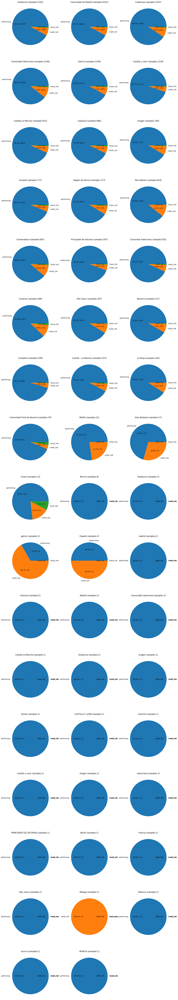

In [84]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutCustomerAddressRegion')

also there seems to be some correlation but actually not a very high one for the region. but still it could be usefull

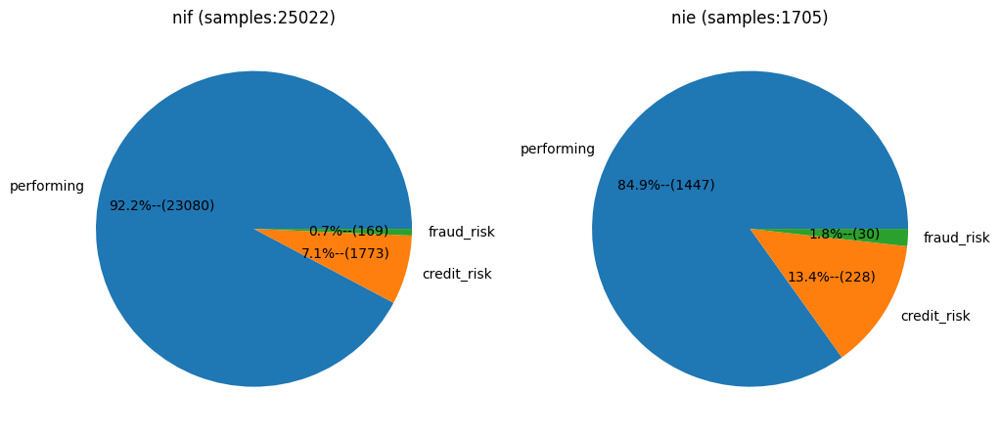

In [85]:
smlp.pie_plot(data = dcat_df, target = 'target', pivot = 'ChoutCustomerDocumentIdType')

for the id type there seems to be a hight correlation actually




In [96]:
# 'id','created','MerId','created','ChoutUserAgentValue'
# iterate thorouh all the column unique values and get the percentage of each value in the target column
unique_vals_merid = df['MerId'].unique()
info_arr = []
for merid in unique_vals_merid:
	performing = len(df[(df['MerId'] == merid) & (df['target'] == 'performing')])
	credit_risk = len(df[(df['MerId'] == merid) & (df['target'] == 'credit_risk')])
	fraud_risk = len(df[(df['MerId'] == merid) & (df['target'] == 'fraud_risk')])
	total = performing + credit_risk + fraud_risk
	info_arr.append([merid, performing, credit_risk, fraud_risk, total])

In [97]:
# sort the info_arr by last column
info_arr = sorted(info_arr, key = lambda x: x[-1], reverse = True)

In [100]:
# now we will print the first 20 rows
for i in range(len(info_arr)):
	performing = info_arr[i][1]
	credit_risk = info_arr[i][2]
	fraud_risk = info_arr[i][3]
	total = info_arr[i][4]
	per_performing = (float(performing) / total)*100
	per_credit_risk = (float(credit_risk) / total)*100
	per_fraud_risk = (float(fraud_risk) / total)*100
	print("Performing: " + str(round(performing,2))  +'--' +  str(round(per_performing,2)) + " | Credit Risk: " + str(round(credit_risk,2)) + '--' +  str(round(per_credit_risk,2)) + " | Fraud Risk: " + str(round(fraud_risk,2)) + '--' + str(round(per_fraud_risk,2)) + " | Total: " + str(total))



Performing: 5277--95.05 | Credit Risk: 270--4.86 | Fraud Risk: 5--0.09 | Total: 5552
Performing: 1597--91.26 | Credit Risk: 132--7.54 | Fraud Risk: 21--1.2 | Total: 1750
Performing: 1002--94.0 | Credit Risk: 61--5.72 | Fraud Risk: 3--0.28 | Total: 1066
Performing: 928--91.25 | Credit Risk: 75--7.37 | Fraud Risk: 14--1.38 | Total: 1017
Performing: 640--91.69 | Credit Risk: 56--8.02 | Fraud Risk: 2--0.29 | Total: 698
Performing: 626--92.19 | Credit Risk: 51--7.51 | Fraud Risk: 2--0.29 | Total: 679
Performing: 640--95.67 | Credit Risk: 26--3.89 | Fraud Risk: 3--0.45 | Total: 669
Performing: 547--91.62 | Credit Risk: 50--8.38 | Fraud Risk: 0--0.0 | Total: 597
Performing: 543--93.94 | Credit Risk: 34--5.88 | Fraud Risk: 1--0.17 | Total: 578
Performing: 454--95.98 | Credit Risk: 19--4.02 | Fraud Risk: 0--0.0 | Total: 473
Performing: 402--92.2 | Credit Risk: 28--6.42 | Fraud Risk: 6--1.38 | Total: 436
Performing: 384--96.73 | Credit Risk: 12--3.02 | Fraud Risk: 1--0.25 | Total: 397
Performing

In [ ]:
print(df['ChoutUserAgentValue'].unique()[:20])

# feature engineering
we will create the following features:
age -- given the customer birthdate
month_created -- given the month of the creation
day_created -- given the day of the creation



In [105]:
# age
# extract the date from the 'created' column and substrac the 'ChoutCustomerBirthday' column to get the age of the customer
df['ChoutCustomerBirthday'] = pd.to_datetime(df['ChoutCustomerBirthday'])
df['created'] = pd.to_datetime(df['created'])
# convert both columns to tz-naive
df['ChoutCustomerBirthday'] = df['ChoutCustomerBirthday'].dt.tz_localize(None)
df['created'] = df['created'].dt.tz_localize(None)
df['age'] = df['created'] - df['ChoutCustomerBirthday']
# convert the age column to years and round to the closest integer
df['age'] = df['age'].dt.days / 365
df['age'] = df['age'].round()

In [111]:
# month_created
df['month_created'] = df['created'].dt.month

In [112]:
# day_created
df['day_created'] = df['created'].dt.day
# we will split all the day values into 4 categories 
# 1-7 -- first week
# 8-14 -- second week
# 15-21 -- third week
# 22-31 -- fourth week
df['week_of_month'] = df['day_created'].apply(lambda x: 1 if x <= 7 else 2 if x <= 14 else 3 if x <= 21 else 4)

# pre process features for feature imputting

we will do a distribution plot on all the numerical features

In [118]:
# first we add the new features from df to num_df
num_df['age'] = df['age']
num_df['month_created'] = df['month_created']
num_df['day_created'] = df['day_created']

/tmp/ipykernel_1245234/1558292893.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_df['age'] = df['age']
/tmp/ipykernel_1245234/1558292893.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  num_df['month_created'] = df['month_created']
/tmp/ipykernel_1245234/1558292893.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/sta

In [119]:
num_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26727 entries, 0 to 26726
Data columns (total 14 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   totalAmount                  26727 non-null  float64
 1   FinPlanPrincipal             26727 non-null  float64
 2   FinPlanDuration              26727 non-null  int64  
 3   FinPlanDownpaymentAmount     26727 non-null  float64
 4   FinPlanTotalInterestAmount   26727 non-null  float64
 5   FinPlanAnnualPercentageRate  26727 non-null  float64
 6   FinPlanCustomerFeeTaxRate    26727 non-null  float64
 7   FinPlanDailyInterestPerCent  26727 non-null  float64
 8   FinPlanInstalmentAmount      26727 non-null  float64
 9   FinPlanNumInstalments        26727 non-null  int64  
 10  target                       26727 non-null  object 
 11  age                          26727 non-null  float64
 12  month_created                26727 non-null  int64  
 13  day_created     

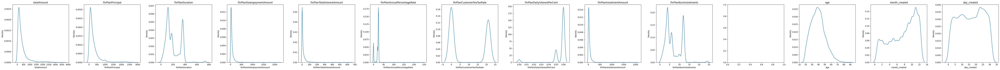

In [120]:
# now using a for loop and subplots we will plot all the numerical features using a kde plot
ncols = len(num_df.columns)
fig, axes = plt.subplots(nrows = 1, ncols = ncols, figsize = (5*ncols, 5))
for i, col in enumerate(num_df.columns):
	if col == 'target':
		continue
	sns.kdeplot(num_df[col], ax = axes[i])
	axes[i].set_title(col)
plt.tight_layout()

In [ ]:
# after looking at the distribution plots we know how to normalize the data
# totalAmount -- quantile cut
# FinPlanPrincipal -- quantile cut
# FinPlanDuration -- cut
# FinPlanInterest -- quantile cut
# FinPlanDownpaymentAmount -- quantile cut
# FinPlanATotallInterestAmount -- qcut
# FinPlanAnnualPercentageRate -- qcut
# FinPlanCustomerFeeTaxRate -- there is only two values here hence we will map them [0.0: 0, 21.0: 1]
# FinPlanDailyInterestPerCent -- there is only three values here hence we will map them with a range ['0.00 - 0.01':0,'0.04 - 0.05': 1,'0.055 - 0.06': 2]
# FinPlanInstalmentAmount -- qcut
# FinPlanNumInstalments -- cut
# age -- cut
#  month_created -- cut
# day_created -- cut

In [126]:
df['totalAmount_qcut'] = pd.qcut(df['totalAmount'], q = 4, labels = False)
df['FinPlanPrincipal_qcut'] = pd.qcut(df['FinPlanPrincipal'], q = 4, labels = False)
# FinPlanDuration goes from 0 to 800 hence we will cut in four ranges
df['FinPlanDownpaymentAmount_qcut'] = pd.qcut(df['FinPlanDownpaymentAmount'], q = 4, labels = False)
df['FinPlanATotalInterestAmount_qcut'] = pd.qcut(df['FinPlanTotalInterestAmount'], q = 4, labels = False)
df['FinPlanAnnualPercentageRate_qcut'] = pd.qcut(df['FinPlanAnnualPercentageRate'], q = 4, labels = False,duplicates = 'drop')
df['FinPlanCustomerFeeTaxRate_map'] = df['FinPlanCustomerFeeTaxRate'].map({0.0: 0, 21.0: 1})
df['FinPlanInstalmentAmount_qcut'] = pd.qcut(df['FinPlanInstalmentAmount'], q = 4, labels = False)
# FinPlanNumInstalments goes from 0 to 25 hence we will cut in four ranges
df['FinPlanNumInstalments_cut'] = pd.cut(df['FinPlanNumInstalments'], bins = [0, 6, 12, 18, 25], labels = False)
df['age_cut'] = pd.cut(df['age'], bins = [0, 25,50,75,100], labels = False)
df['month_created_cut'] = pd.cut(df['month_created'], bins = [0, 3, 6, 9, 12], labels = False)
df['day_created_cut'] = pd.cut(df['day_created'], bins = [0, 7, 14, 21, 31], labels = False)
df['FinPlanDailyInterestPerCent_map'] = pd.cut(df['FinPlanDailyInterestPerCent'], bins = [-1, 0.01, 0.055, 0.07], labels = False)
df['FinPlanDuration_cut'] = pd.cut(df['FinPlanDuration'], bins = [-10, 200, 400, 600, 1000], labels = False)

In [151]:
# we will encode all the categorical data
for i,col in enumerate(cat_cols):
	print(col)

MerActivityName
ChoutOrigin
ChoutUserAgentDeviceModel
ChoutUserAgentOsFamily
ChoutUserAgentIsMobile
ChoutUserAgentIsTablet
ChoutUserAgentDeviceBrand
ChoutUserAgentIsPc
ChoutUserAgentOsVersion
ChoutUserAgentDeviceFamily
ChoutUserAgentBrowserFamily
ChoutUserAgentBrowserVersion
ChoutUserAgentIsTouchCapable
ChoutCustomerBirthday
ChoutCustomerAddressRegion
ChoutCustomerDocumentIdType
FinPlanFirstPaymentDate
target
MerActivityNameEs
MerActivityNameEn


In [176]:
# will create a list to squash
squash_list = ['MerActivityName'
,'ChoutOrigin'
,'ChoutUserAgentDeviceModel'
,'ChoutUserAgentOsFamily'
,'ChoutUserAgentIsMobile'
,'ChoutUserAgentIsTablet'
,'ChoutUserAgentDeviceBrand'
,'ChoutUserAgentIsPc'
,'ChoutUserAgentOsVersion'
,'ChoutUserAgentDeviceFamily'
,'ChoutUserAgentBrowserFamily'
,'ChoutUserAgentBrowserVersion'
,'ChoutUserAgentIsTouchCapable'
,'ChoutCustomerAddressRegion'
,'ChoutCustomerDocumentIdType'
,'FinPlanFirstPaymentDate'
,'target'
]

In [177]:
squash_list.append('MerId')

In [153]:
# for each column in the squash list we will squash the values
# according to reelevance, each category that only gets repeated less than 100 times 
# will be squashed into a new category called 'uncommon'
# each Nan, Null, None will be squashed into a new category called 'unknown'
# and all the categories that have more than a 100 repetitions will be left as is
# also the columns will not be overwritten, a new column will be created called 'colName_squashed'

In [178]:
for i,col in enumerate(squash_list):
	print(i)
	print(col)
	col_squashed = col + '_squashed'
	value_counts = df[col].value_counts()
	value_counts = value_counts[value_counts > 100]
	value_counts_cols = value_counts.index
	df[col_squashed] = df[col].apply(lambda x: 'unknonw' if x in ['',None,np.nan] else ('uncommon' if x not in value_counts_cols else x))

0
MerActivityName
1
ChoutOrigin
2
ChoutUserAgentDeviceModel
3
ChoutUserAgentOsFamily
4
ChoutUserAgentIsMobile
5
ChoutUserAgentIsTablet
6
ChoutUserAgentDeviceBrand
7
ChoutUserAgentIsPc
8
ChoutUserAgentOsVersion
9
ChoutUserAgentDeviceFamily
10
ChoutUserAgentBrowserFamily
11
ChoutUserAgentBrowserVersion
12
ChoutUserAgentIsTouchCapable
13
ChoutCustomerAddressRegion
14
ChoutCustomerDocumentIdType
15
FinPlanFirstPaymentDate
16
target
17
MerId


In [179]:
for i,col in enumerate(squash_list):
	print(col)
	print(len(df[col].value_counts()))

MerActivityName
41
ChoutOrigin
2
ChoutUserAgentDeviceModel
659
ChoutUserAgentOsFamily
17
ChoutUserAgentIsMobile
2
ChoutUserAgentIsTablet
2
ChoutUserAgentDeviceBrand
29
ChoutUserAgentIsPc
2
ChoutUserAgentOsVersion
130
ChoutUserAgentDeviceFamily
640
ChoutUserAgentBrowserFamily
34
ChoutUserAgentBrowserVersion
283
ChoutUserAgentIsTouchCapable
2
ChoutCustomerAddressRegion
50
ChoutCustomerDocumentIdType
2
FinPlanFirstPaymentDate
416
target
3
MerId
500


In [180]:
for i,col in enumerate(squash_list):
	col_name = col + '_squashed'
	print(col_name)
	print(len(df[col_name].value_counts()))

MerActivityName_squashed
27
ChoutOrigin_squashed
2
ChoutUserAgentDeviceModel_squashed
20
ChoutUserAgentOsFamily_squashed
10
ChoutUserAgentIsMobile_squashed
3
ChoutUserAgentIsTablet_squashed
3
ChoutUserAgentDeviceBrand_squashed
9
ChoutUserAgentIsPc_squashed
3
ChoutUserAgentOsVersion_squashed
31
ChoutUserAgentDeviceFamily_squashed
21
ChoutUserAgentBrowserFamily_squashed
15
ChoutUserAgentBrowserVersion_squashed
35
ChoutUserAgentIsTouchCapable_squashed
3
ChoutCustomerAddressRegion_squashed
22
ChoutCustomerDocumentIdType_squashed
2
FinPlanFirstPaymentDate_squashed
82
target_squashed
3
MerId_squashed
49


In [162]:
# now we will numerically encode all the columns that end in squashed
# we will replace all category values with an integer mapping
# example:
# ['a','b','c'] will be mapped to [0,1,2]
# ['a','b','c','a'] will be mapped to [0,1,2,0]
# ['a','b','c','a','b'] will be mapped to [0,1,2,0,1]

In [173]:
for i,col in enumerate(squash_list):
	col_name = col + '_squashed'
	print(col_name)
	value_counts = df[col_name].value_counts()
	mapping = dict(zip(value_counts.index, range(len(value_counts))))
	df[col_name] = df[col_name].map(mapping)

MerActivityName_squashed
ChoutOrigin_squashed
ChoutUserAgentDeviceModel_squashed
ChoutUserAgentOsFamily_squashed
ChoutUserAgentIsMobile_squashed
ChoutUserAgentIsTablet_squashed
ChoutUserAgentDeviceBrand_squashed
ChoutUserAgentIsPc_squashed
ChoutUserAgentOsVersion_squashed
ChoutUserAgentDeviceFamily_squashed
ChoutUserAgentBrowserFamily_squashed
ChoutUserAgentBrowserVersion_squashed
ChoutUserAgentIsTouchCapable_squashed
ChoutCustomerAddressRegion_squashed
ChoutCustomerDocumentIdType_squashed
FinPlanFirstPaymentDate_squashed
target_squashed


In [172]:
for col in df.columns:
	print(col)

id
totalAmount
created
MerActivityCode
MerActivityName
MerId
ChoutOrigin
ChoutUserAgentDeviceModel
ChoutUserAgentOsFamily
ChoutUserAgentIsMobile
ChoutUserAgentIsTablet
ChoutUserAgentDeviceBrand
ChoutUserAgentIsPc
ChoutUserAgentOsVersion
ChoutUserAgentDeviceFamily
ChoutUserAgentBrowserFamily
ChoutUserAgentBrowserVersion
ChoutUserAgentValue
ChoutUserAgentIsTouchCapable
ChoutCustomerBirthday
ChoutCustomerAddressRegion
ChoutCustomerDocumentIdType
FinPlanPrincipal
FinPlanDuration
FinPlanDownpaymentAmount
FinPlanTotalInterestAmount
FinPlanAnnualPercentageRate
FinPlanCustomerFeeTaxRate
FinPlanTotalTaxAmount
FinPlanDailyInterestPerCent
FinPlanInstalmentAmount
FinPlanFirstPaymentDate
FinPlanNumInstalments
target
MerActivityNameEs
MerActivityNameEn
age
month_created
day_created
week_of_month
totalAmount_qcut
FinPlanPrincipal_qcut
FinPlanDuration_cut
FinPlanDownpaymentAmount_qcut
FinPlanATotalInterestAmount_qcut
FinPlanAnnualPercentageRate_qcut
FinPlanCustomerFeeTaxRate_map
FinPlanDailyInterestPe

In [171]:

# MerId was missing squashing
col = 'MerId'
print(col)
col_squashed = col + '_squashed'
value_counts = df[col].value_counts()
value_counts = value_counts[value_counts > 100]
value_counts_cols = value_counts.index
df[col_squashed] = df[col].apply(lambda x: 'unknonw' if x in ['',None,np.nan] else ('uncommon' if x not in value_counts_cols else x))

MerId


In [181]:
# also we will numerically encode MerId
col_name = col + '_squashed'
print(col_name)
value_counts = df[col_name].value_counts()
mapping = dict(zip(value_counts.index, range(len(value_counts))))
df[col_name] = df[col_name].map(mapping)

MerId_squashed


feature selection
first we will create a pre_processed dataframe that will contain all the features we pre processed before
also we will not include unecessary columns like ids and redundant columns

In [182]:
preprocessed = [
'totalAmount_qcut'
,'FinPlanPrincipal_qcut'
,'FinPlanDuration_cut'
,'FinPlanDownpaymentAmount_qcut'
,'FinPlanATotalInterestAmount_qcut'
,'FinPlanAnnualPercentageRate_qcut'
,'FinPlanCustomerFeeTaxRate_map'
,'FinPlanDailyInterestPerCent_map'
,'FinPlanInstalmentAmount_qcut'
,'FinPlanNumInstalments_cut'
,'age_cut'
,'month_created_cut'
,'day_created_cut'
,'MerActivityName_squashed'
,'ChoutOrigin_squashed'
,'ChoutUserAgentDeviceModel_squashed'
,'ChoutUserAgentOsFamily_squashed'
,'ChoutUserAgentIsMobile_squashed'
,'ChoutUserAgentIsTablet_squashed'
,'ChoutUserAgentDeviceBrand_squashed'
,'ChoutUserAgentIsPc_squashed'
,'ChoutUserAgentOsVersion_squashed'
,'ChoutUserAgentDeviceFamily_squashed'
,'ChoutUserAgentBrowserFamily_squashed'
,'ChoutUserAgentBrowserVersion_squashed'
,'ChoutUserAgentIsTouchCapable_squashed'
,'ChoutCustomerAddressRegion_squashed'
,'ChoutCustomerDocumentIdType_squashed'
,'target_squashed'
,'MerId_squashed'
]



In [183]:
pre_df = df[preprocessed]

In [186]:
# get a list of all the columns that are of object type
obj_cols = pre_df.select_dtypes(include=['object']).columns

In [187]:
for i,col in enumerate(obj_cols):
	col_name = col 
	print(col_name)
	value_counts = df[col_name].value_counts()
	mapping = dict(zip(value_counts.index, range(len(value_counts))))
	pre_df[col_name] = df[col_name].map(mapping)

MerActivityName_squashed
ChoutOrigin_squashed
ChoutUserAgentDeviceModel_squashed
ChoutUserAgentOsFamily_squashed
ChoutUserAgentIsMobile_squashed
ChoutUserAgentIsTablet_squashed
ChoutUserAgentDeviceBrand_squashed
ChoutUserAgentIsPc_squashed
ChoutUserAgentOsVersion_squashed
ChoutUserAgentDeviceFamily_squashed
ChoutUserAgentBrowserFamily_squashed
ChoutUserAgentBrowserVersion_squashed
ChoutUserAgentIsTouchCapable_squashed
ChoutCustomerAddressRegion_squashed
ChoutCustomerDocumentIdType_squashed
FinPlanFirstPaymentDate_squashed
target_squashed


In [190]:
for col in obj_cols:
	pre_df[col] = df[col]

/tmp/ipykernel_1245234/1086502607.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pre_df[col] = df[col]


In [191]:
display(pre_df.head())
display(pre_df.info())
display(pre_df.describe())

,totalAmount_qcut,FinPlanPrincipal_qcut,FinPlanDuration_cut,FinPlanDownpaymentAmount_qcut,FinPlanATotalInterestAmount_qcut,FinPlanAnnualPercentageRate_qcut,FinPlanCustomerFeeTaxRate_map,FinPlanDailyInterestPerCent_map,FinPlanInstalmentAmount_qcut,FinPlanNumInstalments_cut,age_cut,month_created_cut,day_created_cut,MerActivityName_squashed,ChoutOrigin_squashed,ChoutUserAgentDeviceModel_squashed,ChoutUserAgentOsFamily_squashed,ChoutUserAgentIsMobile_squashed,ChoutUserAgentIsTablet_squashed,ChoutUserAgentDeviceBrand_squashed,ChoutUserAgentIsPc_squashed,ChoutUserAgentOsVersion_squashed,ChoutUserAgentDeviceFamily_squashed,ChoutUserAgentBrowserFamily_squashed,ChoutUserAgentBrowserVersion_squashed,ChoutUserAgentIsTouchCapable_squashed,ChoutCustomerAddressRegion_squashed,ChoutCustomerDocumentIdType_squashed,FinPlanFirstPaymentDate_squashed,target_squashed,MerId_squashed
0,1,1,0,1,0,0,1,2,1,0,2,3,1,2,0,0,2,1,0,0,1,1,0,0,0,1,2,0,0,0,2
1,0,0,0,0,0,2,1,2,0,0,1,3,1,17,0,3,0,0,0,3,0,2,3,1,0,0,5,0,0,0,0
2,1,1,0,0,0,0,1,2,1,0,1,3,1,2,0,1,1,0,0,1,0,7,1,2,5,0,12,0,0,0,2
3,1,2,1,0,0,0,0,2,1,1,1,3,1,1,0,1,1,0,0,1,0,4,1,2,15,0,8,0,0,0,0
4,3,3,1,2,3,0,0,1,2,1,2,3,1,0,0,1,1,0,0,1,0,7,1,2,5,0,4,0,61,0,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26727 entries, 0 to 26726
Data columns (total 31 columns):
 #   Column                                 Non-Null Count  Dtype
---  ------                                 --------------  -----
 0   totalAmount_qcut                       26727 non-null  int64
 1   FinPlanPrincipal_qcut                  26727 non-null  int64
 2   FinPlanDuration_cut                    26727 non-null  int64
 3   FinPlanDownpaymentAmount_qcut          26727 non-null  int64
 4   FinPlanATotalInterestAmount_qcut       26727 non-null  int64
 5   FinPlanAnnualPercentageRate_qcut       26727 non-null  int64
 6   FinPlanCustomerFeeTaxRate_map          26727 non-null  int64
 7   FinPlanDailyInterestPerCent_map        26727 non-null  int64
 8   FinPlanInstalmentAmount_qcut           26727 non-null  int64
 9   FinPlanNumInstalments_cut              26727 non-null  int64
 10  age_cut                                26727 non-null  int64
 11  month_created_cut           

None

,totalAmount_qcut,FinPlanPrincipal_qcut,FinPlanDuration_cut,FinPlanDownpaymentAmount_qcut,FinPlanATotalInterestAmount_qcut,FinPlanAnnualPercentageRate_qcut,FinPlanCustomerFeeTaxRate_map,FinPlanDailyInterestPerCent_map,FinPlanInstalmentAmount_qcut,FinPlanNumInstalments_cut,age_cut,month_created_cut,day_created_cut,MerActivityName_squashed,ChoutOrigin_squashed,ChoutUserAgentDeviceModel_squashed,ChoutUserAgentOsFamily_squashed,ChoutUserAgentIsMobile_squashed,ChoutUserAgentIsTablet_squashed,ChoutUserAgentDeviceBrand_squashed,ChoutUserAgentIsPc_squashed,ChoutUserAgentOsVersion_squashed,ChoutUserAgentDeviceFamily_squashed,ChoutUserAgentBrowserFamily_squashed,ChoutUserAgentBrowserVersion_squashed,ChoutUserAgentIsTouchCapable_squashed,ChoutCustomerAddressRegion_squashed,ChoutCustomerDocumentIdType_squashed,FinPlanFirstPaymentDate_squashed,target_squashed,MerId_squashed
count,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000
mean,1.499981,1.499757,0.376810,1.499944,1.499981,0.721256,0.435777,1.740712,1.499981,0.377558,1.050511,1.874883,1.701949,5.272683,0.008157,1.844128,1.827964,0.570285,0.153964,1.307554,0.517941,6.181876,2.160699,2.459199,7.291840,0.517604,4.712276,0.063793,16.931006,0.089759,8.633591
std,1.118072,1.117871,0.526629,1.118072,1.118072,0.643219,0.495867,0.522957,1.118072,0.526875,0.512794,1.118170,1.154523,5.966163,0.089946,3.300490,1.955015,0.586195,0.478351,1.773590,0.590121,7.107425,3.578294,3.005827,7.347384,0.590131,5.232560,0.244389,23.344675,0.310802,12.018493
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.500000,0.500000,0.000000,0.500000,0.500000,0.000000,0.000000,2.000000,0.500000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
50%,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,2.000000,1.000000,0.000000,1.000000,2.000000,2.000000,3.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,1.000000,1.000000,5.000000,0.000000,2.000000,0.000000,2.000000,0.000000,2.000000
75%,2.500000,2.000000,1.000000,2.500000,2.500000,1.000000,1.000000,2.000000,2.500000,1.000000,1.000000,3.000000,3.000000,8.000000,0.000000,2.000000,2.000000,1.000000,0.000000,2.000000,1.000000,9.000000,2.000000,3.000000,10.000000,1.000000,7.000000,0.000000,30.000000,0.000000,12.000000
max,3.000000,3.000000,3.000000,3.000000,3.000000,2.000000,1.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,26.000000,1.000000,19.000000,9.000000,2.000000,2.000000,8.000000,2.000000,30.000000,20.000000,14.000000,34.000000,2.000000,21.000000,1.000000,81.000000,2.000000,48.000000


In [189]:
display(df.head())
display(df.info())
display(df.describe())




,id,totalAmount,created,MerActivityCode,MerActivityName,MerId,ChoutOrigin,ChoutUserAgentDeviceModel,ChoutUserAgentOsFamily,ChoutUserAgentIsMobile,ChoutUserAgentIsTablet,ChoutUserAgentDeviceBrand,ChoutUserAgentIsPc,ChoutUserAgentOsVersion,ChoutUserAgentDeviceFamily,ChoutUserAgentBrowserFamily,ChoutUserAgentBrowserVersion,ChoutUserAgentValue,ChoutUserAgentIsTouchCapable,ChoutCustomerBirthday,ChoutCustomerAddressRegion,ChoutCustomerDocumentIdType,FinPlanPrincipal,FinPlanDuration,FinPlanDownpaymentAmount,FinPlanTotalInterestAmount,FinPlanAnnualPercentageRate,FinPlanCustomerFeeTaxRate,FinPlanTotalTaxAmount,FinPlanDailyInterestPerCent,FinPlanInstalmentAmount,FinPlanFirstPaymentDate,FinPlanNumInstalments,target,MerActivityNameEs,MerActivityNameEn,age,month_created,day_created,week_of_month,totalAmount_qcut,FinPlanPrincipal_qcut,FinPlanDuration_cut,FinPlanDownpaymentAmount_qcut,FinPlanATotalInterestAmount_qcut,FinPlanAnnualPercentageRate_qcut,FinPlanCustomerFeeTaxRate_map,FinPlanDailyInterestPerCent_map,FinPlanInstalmentAmount_qcut,FinPlanNumInstalments_cut,age_cut,month_created_cut,day_created_cut,MerActivityName_squashed,ChoutOrigin_squashed,ChoutUserAgentDeviceModel_squashed,ChoutUserAgentOsFamily_squashed,ChoutUserAgentIsMobile_squashed,ChoutUserAgentIsTablet_squashed,ChoutUserAgentDeviceBrand_squashed,ChoutUserAgentIsPc_squashed,ChoutUserAgentOsVersion_squashed,ChoutUserAgentDeviceFamily_squashed,ChoutUserAgentBrowserFamily_squashed,ChoutUserAgentBrowserVersion_squashed,ChoutUserAgentIsTouchCapable_squashed,ChoutCustomerAddressRegion_squashed,ChoutCustomerDocumentIdType_squashed,FinPlanFirstPaymentDate_squashed,target_squashed,MerId_squashed
0,9a2d10fd9e8941de98cc7de1441fdcda,148.27,2018-12-08 09:35:07.751401,10,Informatica y Electrónica,776b630e228e499c83b66f8f0ddaab18,online,NaN,windows,False,False,NaN,True,10,other,Chrome,70.0.3538,Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebK...,False,1954-02-03,Catalunya,nif,118.616000,121,29.65,0.000000,0.0,21.0,0.0,0.060055,29.654000,2019-01-08,4,performing,NaN,NaN,65.0,12,8,2,1,1,0,1,0,0,1,2,1,0,2,3,1,2,0,0,2,1,0,0,1,1,0,0,0,1,2,0,0,0,2
1,d4183f2f7bde479fa22b00fc13f478d0,26.77,2018-12-08 09:58:42.707651,16,Mascotas,94095397bf6e449e8332ac678040ab70,online,Smartphone,android,True,False,Generic,False,8.0.0,generic smartphone,Chrome Mobile,70.0.3538,Mozilla/5.0 (Linux; Android 8.0.0; RNE-L21) Ap...,True,1991-11-10,Castilla y León,nif,19.891289,90,6.88,0.744844,24.5,21.0,0.0,0.060055,6.878711,2019-01-08,3,performing,NaN,NaN,27.0,12,8,2,0,0,0,0,0,2,1,2,0,0,1,3,1,17,0,3,0,0,0,3,0,2,3,1,0,0,5,0,0,0,0
2,339c4435b0e0461eb7d8149d702bf88a,155.99,2018-12-08 09:38:55.413728,10,Informatica y Electrónica,776b630e228e499c83b66f8f0ddaab18,online,iPhone,ios,True,False,Apple,False,12.1,iphone,Mobile Safari,12.0,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,True,1992-05-07,Extremadura,nif,133.705714,182,22.28,0.000000,0.0,21.0,0.0,0.060055,22.284286,2019-01-08,6,performing,NaN,NaN,27.0,12,8,2,1,1,0,0,0,0,1,2,1,0,1,3,1,2,0,1,1,0,0,1,0,7,1,2,5,0,12,0,0,0,2
3,68a840a4725144118aca09513a5db11b,189.00,2018-12-08 11:56:24.190451,17,Moda y Complementos,e2f9246b7b9e432fb07372c1b1d36dcc,online,iPhone,ios,True,False,Apple,False,10.3.2,iphone,Mobile Safari,10,Mozilla/5.0 (iPhone; CPU iPhone OS 10_3_2 like...,True,1980-01-30,Aragón,nif,170.100000,274,18.90,0.000000,0.0,0.0,0.0,0.060055,18.900000,2019-01-08,9,performing,NaN,NaN,39.0,12,8,2,1,2,1,0,0,0,0,2,1,1,1,3,1,1,0,1,1,0,0,1,0,4,1,2,15,0,8,0,0,0,0
4,5ed94ecd629e4d65a76e6d32aedf8fa5,482.79,2018-12-08 09:09:19.901214,9,Hogar y Decoración,513f1c5b8be0415497902ee716840403,online,iPhone,ios,True,False,Apple,False,12.1,iphone,Mobile Safari,12.0,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,True,1959-01-30,Galicia,nif,442.236802,361,40.55,44.401573,20.0,0.0,0.0,0.049964,40.553198,2019-01-04,12,performing,NaN,NaN,60.0,12,8,2,3,3,1,2,3,0,0,1,2,1,2,3,1,0,0,1,1,0,0,1,0,7,1,2,5,0,4,0,61,0,1


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26727 entries, 0 to 26726
Data columns (total 71 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   id                                     26727 non-null  object        
 1   totalAmount                            26727 non-null  float64       
 2   created                                26727 non-null  datetime64[ns]
 3   MerActivityCode                        26727 non-null  int64         
 4   MerActivityName                        26727 non-null  object        
 5   MerId                                  26727 non-null  object        
 6   ChoutOrigin                            26727 non-null  object        
 7   ChoutUserAgentDeviceModel              14201 non-null  object        
 8   ChoutUserAgentOsFamily                 25410 non-null  object        
 9   ChoutUserAgentIsMobile                 25410 non-null  object

None

,totalAmount,MerActivityCode,FinPlanPrincipal,FinPlanDuration,FinPlanDownpaymentAmount,FinPlanTotalInterestAmount,FinPlanAnnualPercentageRate,FinPlanCustomerFeeTaxRate,FinPlanTotalTaxAmount,FinPlanDailyInterestPerCent,FinPlanInstalmentAmount,FinPlanNumInstalments,age,month_created,day_created,week_of_month,totalAmount_qcut,FinPlanPrincipal_qcut,FinPlanDuration_cut,FinPlanDownpaymentAmount_qcut,FinPlanATotalInterestAmount_qcut,FinPlanAnnualPercentageRate_qcut,FinPlanCustomerFeeTaxRate_map,FinPlanDailyInterestPerCent_map,FinPlanInstalmentAmount_qcut,FinPlanNumInstalments_cut,age_cut,month_created_cut,day_created_cut,MerActivityName_squashed,ChoutOrigin_squashed,ChoutUserAgentDeviceModel_squashed,ChoutUserAgentOsFamily_squashed,ChoutUserAgentIsMobile_squashed,ChoutUserAgentIsTablet_squashed,ChoutUserAgentDeviceBrand_squashed,ChoutUserAgentIsPc_squashed,ChoutUserAgentOsVersion_squashed,ChoutUserAgentDeviceFamily_squashed,ChoutUserAgentBrowserFamily_squashed,ChoutUserAgentBrowserVersion_squashed,ChoutUserAgentIsTouchCapable_squashed,ChoutCustomerAddressRegion_squashed,ChoutCustomerDocumentIdType_squashed,FinPlanFirstPaymentDate_squashed,target_squashed,MerId_squashed
count,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.0,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000,26727.000000
mean,363.783704,11.621768,288.146210,199.837505,66.991562,15.200610,18.603670,9.151308,0.0,0.055810,53.951505,6.667976,39.224829,7.656265,16.326898,2.701949,1.499981,1.499757,0.376810,1.499944,1.499981,0.721256,0.435777,1.740712,1.499981,0.377558,1.050511,1.874883,1.701949,5.272683,0.008157,1.844128,1.827964,0.570285,0.153964,1.307554,0.517941,6.181876,2.160699,2.459199,7.291840,0.517604,4.712276,0.063793,16.931006,0.089759,8.633591
std,426.207521,5.055020,366.558646,118.875399,95.940822,28.616398,9.849386,10.413217,0.0,0.012128,100.557838,3.914561,10.992732,3.487983,8.850832,1.154523,1.118072,1.117871,0.526629,1.118072,1.118072,0.643219,0.495867,0.522957,1.118072,0.526875,0.512794,1.118170,1.154523,5.966163,0.089946,3.300490,1.955015,0.586195,0.478351,1.773590,0.590121,7.107425,3.578294,3.005827,7.347384,0.590131,5.232560,0.244389,23.344675,0.310802,12.018493
min,0.800000,3.000000,0.005740,0.000000,0.190000,0.000000,-0.000255,0.000000,0.0,0.000000,0.001170,1.000000,18.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,122.310000,9.000000,86.752256,119.000000,23.295000,1.066514,20.000000,0.000000,0.0,0.060055,17.958051,4.000000,31.000000,5.000000,9.000000,2.000000,0.500000,0.500000,0.000000,0.500000,0.500000,0.000000,0.000000,2.000000,0.500000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,2.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000
50%,222.040000,10.000000,168.458784,162.000000,40.000000,5.199420,24.500000,0.000000,0.0,0.060055,32.218629,6.000000,39.000000,9.000000,17.000000,3.000000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,2.000000,1.000000,0.000000,1.000000,2.000000,2.000000,3.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,3.000000,1.000000,1.000000,5.000000,0.000000,2.000000,0.000000,2.000000,0.000000,2.000000
75%,427.785000,17.000000,337.392259,336.00000

In [ ]:
# we will drop only the least productive columns
kendal_cols = sml.get_kendall(pre_df, 'target_squashed', 0.8)

In [ ]:
pre_df = pre_df[kendal_cols]

# machine learning training

In [ ]:
# we will train several machine learning models and see the best ones
# we will train random forest, logistic regression, linear regression, descision tree, kmeans, svc




In [204]:
importlib.reload(sml)

<module 'simpleml' from '/home/rockhight/Documents/gitRepos/data_science_exercises/2anomalias/anomalias/simpleml.py'>

In [205]:
smlp = sml.plot()

In [206]:
smlt = sml.test()

In [209]:
target = 'target_squashed'

In [211]:
# now we will test multiple machine learning models
smlt.test_descision_tree(pre_df,target)

max_depth =  1 accuracy =  0.918443696221474
max_depth =  2 accuracy =  0.918443696221474
max_depth =  3 accuracy =  0.918443696221474
max_depth =  4 accuracy =  0.9186307519640853
max_depth =  5 accuracy =  0.9182566404788627
max_depth =  6 accuracy =  0.9161990273101385
max_depth =  7 accuracy =  0.9158249158249159


0.9186307519640853

In [212]:
smlt.test_svc(pre_df,target)

0.9178825289936401

In [214]:
smlt.test_kneighbors(pre_df,target)

k =  1 accuracy =  0.8593340815563038
k =  2 accuracy =  0.9107744107744108
k =  3 accuracy =  0.9047886270108493
k =  4 accuracy =  0.9150766928544707
k =  5 accuracy =  0.9139543583988028
k =  6 accuracy =  0.9171343060231949
k =  7 accuracy =  0.9176954732510288
k =  8 accuracy =  0.9182566404788627
k =  9 accuracy =  0.9190048634493079
k =  10 accuracy =  0.9186307519640853
k =  11 accuracy =  0.918443696221474
k =  12 accuracy =  0.918443696221474
k =  13 accuracy =  0.9186307519640853
k =  14 accuracy =  0.9188178077066966
k =  15 accuracy =  0.9186307519640853
k =  16 accuracy =  0.9191919191919192
k =  17 accuracy =  0.9188178077066966
k =  18 accuracy =  0.918443696221474
k =  19 accuracy =  0.918443696221474


0.9191919191919192

In [215]:
smlt.test_random_forest(pre_df,target)

0.9178825289936401

In [ ]:
smlt.test_stocastic_gradient_descent(pre_df,target)












In [168]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26727 entries, 0 to 26726
Data columns (total 70 columns):
 #   Column                                 Non-Null Count  Dtype         
---  ------                                 --------------  -----         
 0   id                                     26727 non-null  object        
 1   totalAmount                            26727 non-null  float64       
 2   created                                26727 non-null  datetime64[ns]
 3   MerActivityCode                        26727 non-null  int64         
 4   MerActivityName                        26727 non-null  object        
 5   MerId                                  26727 non-null  object        
 6   ChoutOrigin                            26727 non-null  object        
 7   ChoutUserAgentDeviceModel              14201 non-null  object        
 8   ChoutUserAgentOsFamily                 25410 non-null  object        
 9   ChoutUserAgentIsMobile                 25410 non-null  object

In [169]:
df.head()

,id,totalAmount,created,MerActivityCode,MerActivityName,MerId,ChoutOrigin,ChoutUserAgentDeviceModel,ChoutUserAgentOsFamily,ChoutUserAgentIsMobile,ChoutUserAgentIsTablet,ChoutUserAgentDeviceBrand,ChoutUserAgentIsPc,ChoutUserAgentOsVersion,ChoutUserAgentDeviceFamily,ChoutUserAgentBrowserFamily,ChoutUserAgentBrowserVersion,ChoutUserAgentValue,ChoutUserAgentIsTouchCapable,ChoutCustomerBirthday,ChoutCustomerAddressRegion,ChoutCustomerDocumentIdType,FinPlanPrincipal,FinPlanDuration,FinPlanDownpaymentAmount,FinPlanTotalInterestAmount,FinPlanAnnualPercentageRate,FinPlanCustomerFeeTaxRate,FinPlanTotalTaxAmount,FinPlanDailyInterestPerCent,FinPlanInstalmentAmount,FinPlanFirstPaymentDate,FinPlanNumInstalments,target,MerActivityNameEs,MerActivityNameEn,age,month_created,day_created,week_of_month,totalAmount_qcut,FinPlanPrincipal_qcut,FinPlanDuration_cut,FinPlanDownpaymentAmount_qcut,FinPlanATotalInterestAmount_qcut,FinPlanAnnualPercentageRate_qcut,FinPlanCustomerFeeTaxRate_map,FinPlanDailyInterestPerCent_map,FinPlanInstalmentAmount_qcut,FinPlanNumInstalments_cut,age_cut,month_created_cut,day_created_cut,MerActivityName_squashed,ChoutOrigin_squashed,ChoutUserAgentDeviceModel_squashed,ChoutUserAgentOsFamily_squashed,ChoutUserAgentIsMobile_squashed,ChoutUserAgentIsTablet_squashed,ChoutUserAgentDeviceBrand_squashed,ChoutUserAgentIsPc_squashed,ChoutUserAgentOsVersion_squashed,ChoutUserAgentDeviceFamily_squashed,ChoutUserAgentBrowserFamily_squashed,ChoutUserAgentBrowserVersion_squashed,ChoutUserAgentIsTouchCapable_squashed,ChoutCustomerAddressRegion_squashed,ChoutCustomerDocumentIdType_squashed,FinPlanFirstPaymentDate_squashed,target_squashed
0,9a2d10fd9e8941de98cc7de1441fdcda,148.27,2018-12-08 09:35:07.751401,10,Informatica y Electrónica,776b630e228e499c83b66f8f0ddaab18,online,NaN,windows,False,False,NaN,True,10,other,Chrome,70.0.3538,Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebK...,False,1954-02-03,Catalunya,nif,118.616000,121,29.65,0.000000,0.0,21.0,0.0,0.060055,29.654000,2019-01-08,4,performing,NaN,NaN,65.0,12,8,2,1,1,0,1,0,0,1,2,1,0,2,3,1,2,0,0,2,1,0,0,1,1,0,0,0,1,2,0,0,0
1,d4183f2f7bde479fa22b00fc13f478d0,26.77,2018-12-08 09:58:42.707651,16,Mascotas,94095397bf6e449e8332ac678040ab70,online,Smartphone,android,True,False,Generic,False,8.0.0,generic smartphone,Chrome Mobile,70.0.3538,Mozilla/5.0 (Linux; Android 8.0.0; RNE-L21) Ap...,True,1991-11-10,Castilla y León,nif,19.891289,90,6.88,0.744844,24.5,21.0,0.0,0.060055,6.878711,2019-01-08,3,performing,NaN,NaN,27.0,12,8,2,0,0,0,0,0,2,1,2,0,0,1,3,1,17,0,3,0,0,0,3,0,2,3,1,0,0,5,0,0,0
2,339c4435b0e0461eb7d8149d702bf88a,155.99,2018-12-08 09:38:55.413728,10,Informatica y Electrónica,776b630e228e499c83b66f8f0ddaab18,online,iPhone,ios,True,False,Apple,False,12.1,iphone,Mobile Safari,12.0,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,True,1992-05-07,Extremadura,nif,133.705714,182,22.28,0.000000,0.0,21.0,0.0,0.060055,22.284286,2019-01-08,6,performing,NaN,NaN,27.0,12,8,2,1,1,0,0,0,0,1,2,1,0,1,3,1,2,0,1,1,0,0,1,0,7,1,2,5,0,12,0,0,0
3,68a840a4725144118aca09513a5db11b,189.00,2018-12-08 11:56:24.190451,17,Moda y Complementos,e2f9246b7b9e432fb07372c1b1d36dcc,online,iPhone,ios,True,False,Apple,False,10.3.2,iphone,Mobile Safari,10,Mozilla/5.0 (iPhone; CPU iPhone OS 10_3_2 like...,True,1980-01-30,Aragón,nif,170.100000,274,18.90,0.000000,0.0,0.0,0.0,0.060055,18.900000,2019-01-08,9,performing,NaN,NaN,39.0,12,8,2,1,2,1,0,0,0,0,2,1,1,1,3,1,1,0,1,1,0,0,1,0,4,1,2,15,0,8,0,0,0
4,5ed94ecd629e4d65a76e6d32aedf8fa5,482.79,2018-12-08 09:09:19.901214,9,Hogar y Decoración,513f1c5b8be0415497902ee716840403,online,iPhone,ios,True,False,Apple,False,12.1,iphone,Mobile Safari,12.0,Mozilla/5.0 (iPhone; CPU iPhone OS 12_1 like M...,True,1959-01-30,Galicia,nif,442.236802,361,40.55,44.401573,20.0,0.0,0.0,0.049964,40.553198,2019-01-04,12,performing,NaN,NaN,60.0,12,8,2,3,3,1,2,3,0,0,1,2,1,2,3,1,0,0,1,1,0,0,1,0,7,1,2,5,0,4,0,61,0
